# Introduction

This is the notebook used to do a quick bit of EDA on my data for this analysis. In it, I essentially ensure that everything is behaving properly, and maybe make a few maps.

In [30]:
import matplotlib.pyplot as plt
import seaborn as sns
import geoplot

import geopandas as gpd
import pandas as pd

## Streetview EDA

In [31]:
streetview = pd.read_csv('../data/streetview_greenery.csv')
streetview = gpd.GeoDataFrame(streetview, geometry=gpd.points_from_xy(streetview.longitude, streetview.latitude), crs='EPSG:4326')

chicago_boundaries = gpd.read_file('../data/shapes/chicago_boundaries.geojson')

In [32]:
 streetview.describe()

,longitude,latitude,heading,absolute_greenery,relative_greenery,relative_tree
count,24240.000000,24240.000000,24240.000000,24240.000000,24240.000000,24240.000000
mean,-87.683971,41.845182,179.577640,64488.564893,0.281614,0.226197
std,0.068237,0.098408,104.064114,43313.214898,0.189144,0.163479
min,-87.939814,41.644595,0.000000,0.000000,0.000000,0.000000
25%,-87.728211,41.761276,89.000000,28226.000000,0.123260,0.084243
50%,-87.679274,41.849100,180.000000,60655.500000,0.264876,0.205352
75%,-87.636934,41.932948,270.000000,95774.000000,0.418234,0.349101
max,-87.524527,42.022293,359.000000,228996.000000,1.000000,1.000000


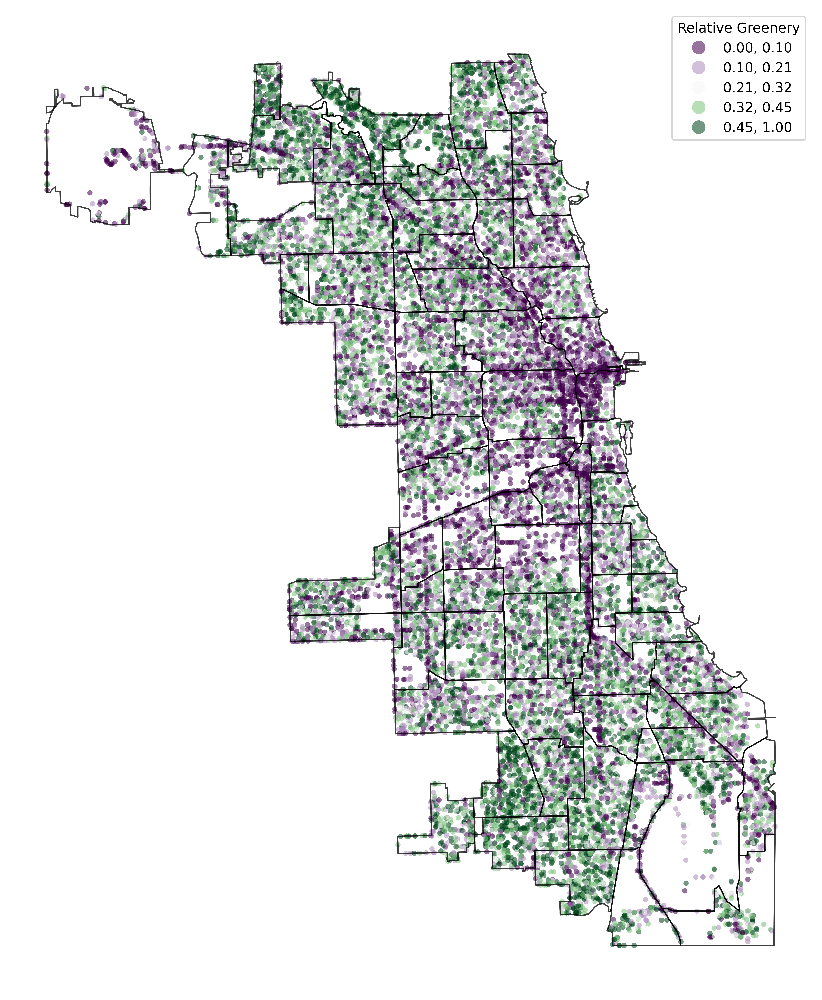

In [33]:
fig, ax = plt.subplots(figsize=(13,13), dpi=500)
streetview.plot("relative_greenery", ax=ax, alpha=.55,
            cmap='PRGn', scheme='quantiles', markersize=15, legend=True, edgecolor='None',
           legend_kwds = {
               'title':'Relative Greenery'
           }
            )
chicago_boundaries.plot(facecolor='none', ax=ax, alpha=.75)
ax.axis('off')

plt.savefig('map.svg')


In [34]:
streetview['month'] = streetview['dates'].apply(lambda x: x.split('-')[1])
streetview['year'] = streetview['dates'].apply(lambda  x: x.split('-')[0])

<Axes: xlabel='month'>

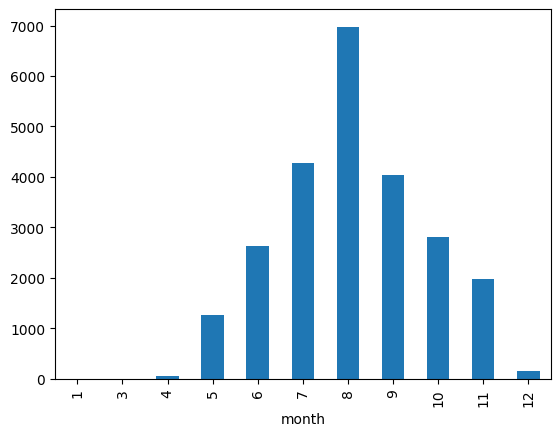

In [35]:
streetview['month'].astype(int).value_counts().sort_index().plot(kind='bar')

<Axes: xlabel='year'>

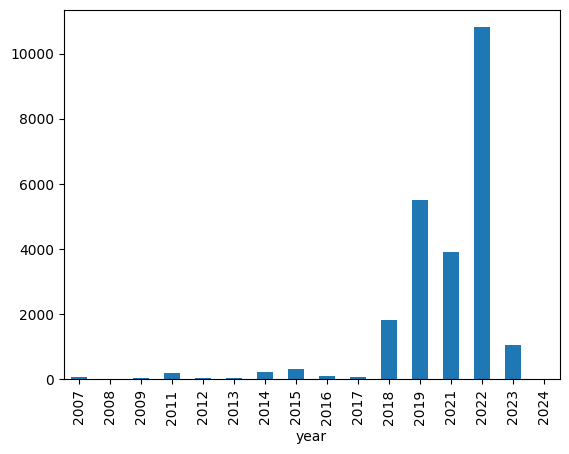

In [36]:
streetview['year'].astype(int).value_counts().sort_index().plot(kind='bar')

## Chicago Data Portal

In [37]:
import matplotlib.pyplot as plt
import datashader as ds
import colorcet
import geopandas as gpd
import pandas as pd

In [38]:
threeoneone = pd.read_csv('../data/311reqs.csv')
threeoneone = gpd.GeoDataFrame(
    threeoneone, geometry=gpd.points_from_xy(threeoneone.longitude, threeoneone.latitude),
    crs='EPSG:4326'
)

violent_crime = pd.read_csv('../data/violent_crime2023.csv')
violent_crime = gpd.GeoDataFrame(
    violent_crime, geometry=gpd.points_from_xy(violent_crime.longitude, violent_crime.latitude),
    crs='EPSG:4326'
)

narcotic_crime = pd.read_csv('../data/narcotic_crime2023.csv')
narcotic_crime = gpd.GeoDataFrame(
    narcotic_crime, geometry=gpd.points_from_xy(narcotic_crime.longitude, narcotic_crime.latitude),
    crs='EPSG:4326'
)

#### 311 Maps

In [39]:
threeoneone.head()

,Unnamed: 0,sr_number,sr_type,sr_short_code,created_date,community_area,latitude,longitude,disorder_class,GEOID,geometry
0,0,SR23-02251193,Street Light Pole Damage Complaint,SFK,2023-12-31T03:13:45.000,53.0,41.663199,-87.645090,PHYSICAL,17031821402,POINT (-87.64509 41.66320)
1,12,SR23-02251180,Aircraft Noise Complaint,AVN,2023-12-31T02:35:07.000,76.0,41.994900,-87.887749,PHYSICAL,17031980000,POINT (-87.88775 41.99490)
2,15,SR23-02251177,Aircraft Noise Complaint,AVN,2023-12-31T02:26:44.000,76.0,41.994900,-87.887749,PHYSICAL,17031980000,POINT (-87.88775 41.99490)
3,16,SR23-02251176,Building Violation,BBA,2023-12-31T02:26:04.000,49.0,41.700027,-87.620993,PHYSICAL,17031490902,POINT (-87.62099 41.70003)
4,22,SR23-02251169,Aircraft Noise Complaint,AVN,2023-12-31T02:12:03.000,76.0,41.994900,-87.887749,PHYSICAL,17031980000,POINT (-87.88775 41.99490)


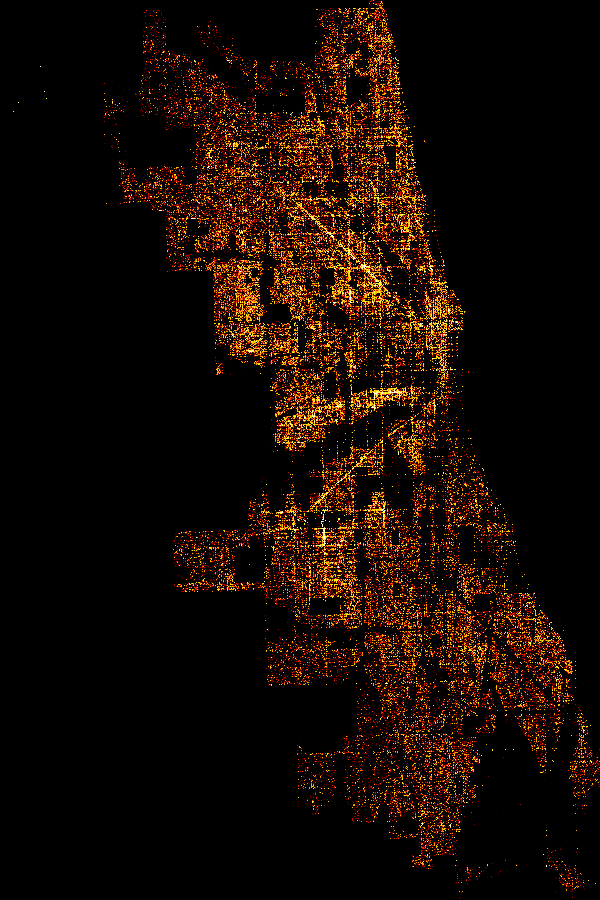

In [40]:
scale = 600
canvas = ds.Canvas(plot_width=scale, plot_height=int(scale*1.5))
agg = canvas.points(threeoneone, geometry='geometry')
img = ds.tf.shade(agg, cmap=colorcet.fire)
img = ds.tf.set_background(img, 'black')
img

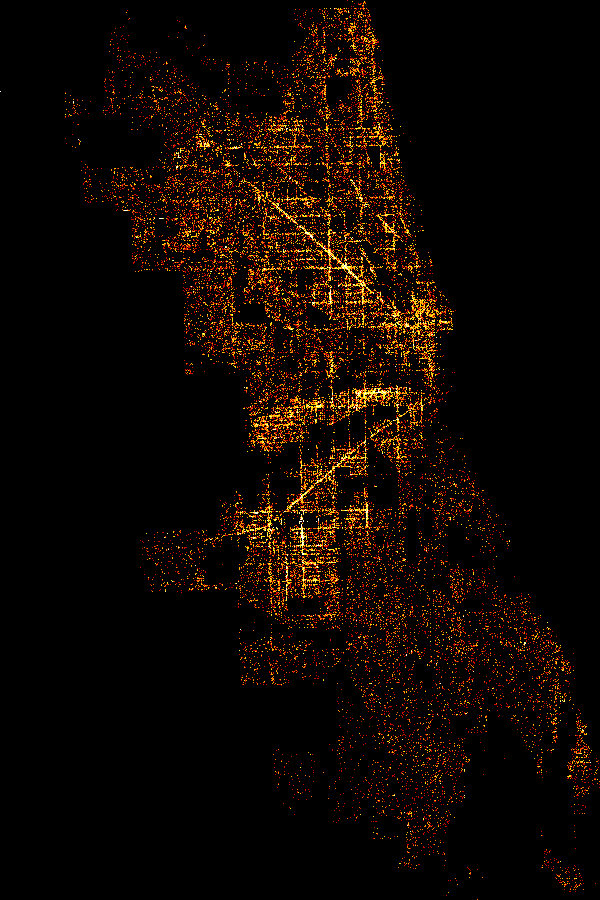

In [41]:
scale = 600
canvas = ds.Canvas(plot_width=scale, plot_height=int(scale*1.5))
agg = canvas.points(threeoneone[threeoneone['disorder_class']=='SOCIAL'], geometry='geometry')
img = ds.tf.shade(agg, cmap=colorcet.fire)
img = ds.tf.set_background(img, 'black')
img

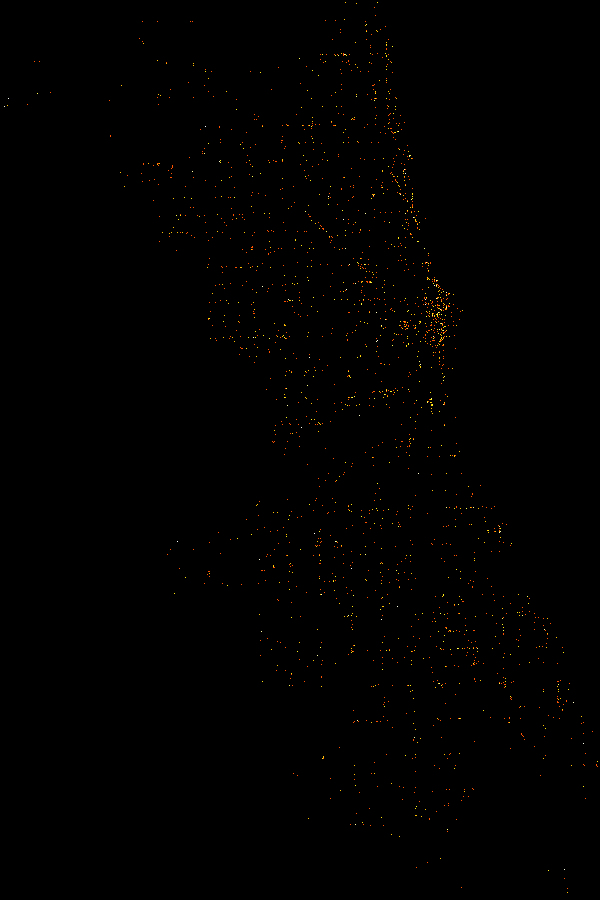

In [42]:
scale = 600
canvas = ds.Canvas(plot_width=scale, plot_height=int(scale*1.5))
agg = canvas.points(threeoneone[threeoneone['disorder_class']=='ECONOMIC'], geometry='geometry')
img = ds.tf.shade(agg, cmap=colorcet.fire)
img = ds.tf.set_background(img, 'black')
img

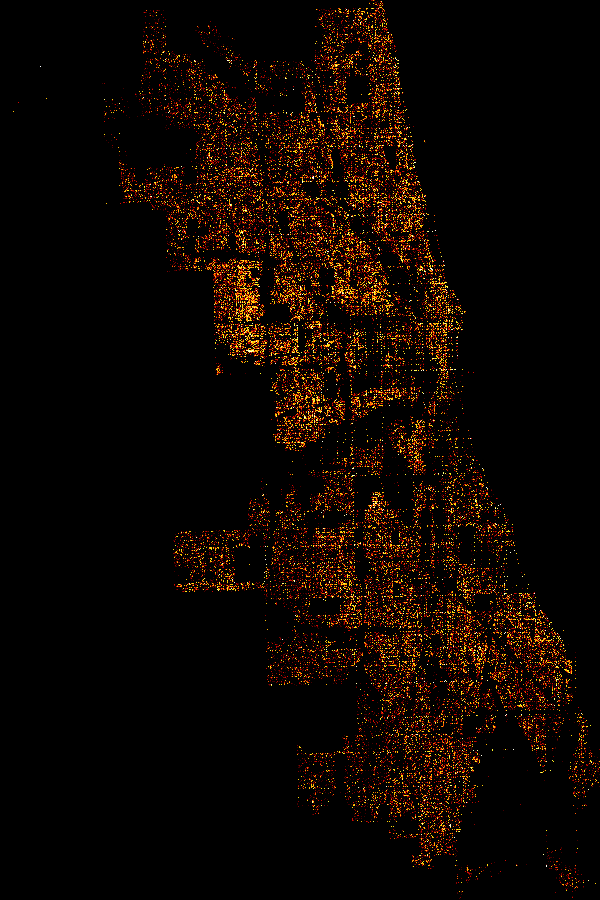

In [43]:
scale = 600
canvas = ds.Canvas(plot_width=scale, plot_height=int(scale*1.5))
agg = canvas.points(threeoneone[threeoneone['disorder_class']=='PHYSICAL'], geometry='geometry')
img = ds.tf.shade(agg, cmap=colorcet.fire)
img = ds.tf.set_background(img, 'black')
img

#### Crime

In [44]:
violent_crime.head()

,Unnamed: 0,id,case_number,date,iucr,primary_type,description,location_description,arrest,domestic,beat,district,ward,community_area,fbi_code,year,latitude,longitude,GEOID,geometry
0,7,13322015,JG558104,2023-12-29T01:15:00.000,0486,BATTERY,DOMESTIC BATTERY SIMPLE,APARTMENT,False,True,311,3,20.0,40,08B,2023,41.780946,-87.621995,17031400800,POINT (-87.62200 41.78095)
1,8,13322052,JG558092,2023-12-29T01:10:00.000,0486,BATTERY,DOMESTIC BATTERY SIMPLE,RESIDENCE,False,True,2514,25,31.0,19,08B,2023,41.935011,-87.759813,17031190300,POINT (-87.75981 41.93501)
2,9,13322028,JG558086,2023-12-29T01:01:00.000,0326,ROBBERY,AGGRAVATED VEHICULAR HIJACKING,GAS STATION,False,False,731,7,6.0,69,03,2023,41.764632,-87.628312,17031691100,POINT (-87.62831 41.76463)
3,13,13322979,JG558125,2023-12-29T01:00:00.000,0460,BATTERY,SIMPLE,OTHER (SPECIFY),False,False,2024,20,48.0,3,08B,2023,41.972170,-87.656300,17031031200,POINT (-87.65630 41.97217)
4,15,13322004,JG558088,2023-12-29T00:45:00.000,0486,BATTERY,DOMESTIC BATTERY SIMPLE,APARTMENT,True,True,1624,16,38.0,15,08B,2023,41.955858,-87.768313,17031150402,POINT (-87.76831 41.95586)


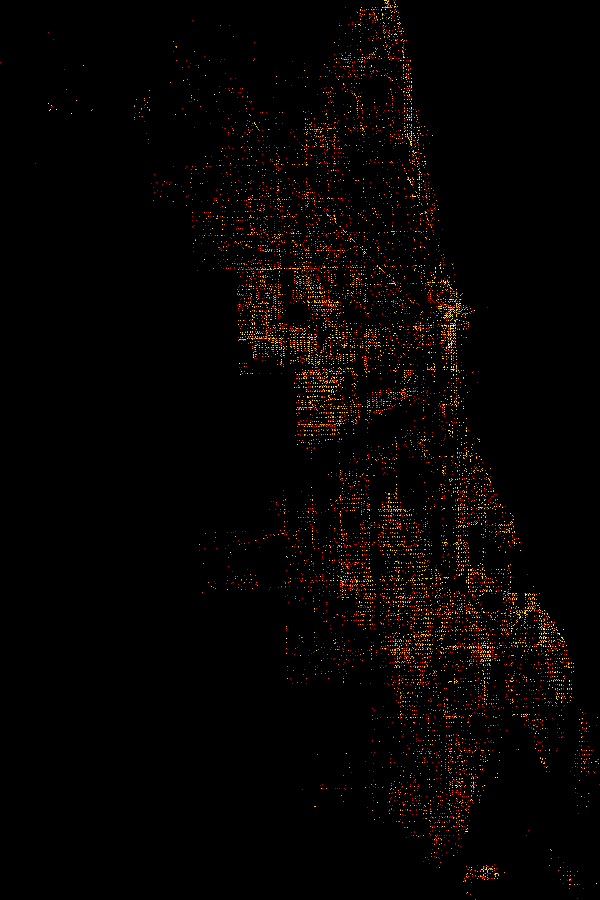

In [45]:
scale = 600
canvas = ds.Canvas(plot_width=scale, plot_height=int(scale*1.5))
agg = canvas.points(violent_crime, geometry='geometry')
img = ds.tf.shade(agg, cmap=colorcet.fire)
img = ds.tf.set_background(img, 'black')
img

In [46]:
narcotic_crime.head()

,Unnamed: 0,id,case_number,date,iucr,primary_type,description,location_description,arrest,domestic,beat,district,ward,community_area,fbi_code,year,latitude,longitude,GEOID,geometry
0,104,13321960,JG558007,2023-12-28T21:53:00.000,1822,NARCOTICS,MANUFACTURE / DELIVER - CANNABIS OVER 10 GRAMS,STREET,True,False,2533,25,37.0,25,18,2023,41.912145,-87.745932,17031831300,POINT (-87.74593 41.91215)
1,179,13321957,JG557913,2023-12-28T19:29:00.000,1822,NARCOTICS,MANUFACTURE / DELIVER - CANNABIS OVER 10 GRAMS,GAS STATION,True,False,623,6,6.0,69,18,2023,41.757231,-87.624739,17031691200,POINT (-87.62474 41.75723)
2,181,13321843,JG557897,2023-12-28T19:21:00.000,2022,NARCOTICS,POSSESS - COCAINE,STREET,True,False,614,6,21.0,71,18,2023,41.736991,-87.663095,17031711100,POINT (-87.66310 41.73699)
3,200,13321669,JG557832,2023-12-28T18:57:00.000,2024,NARCOTICS,POSSESS - HEROIN (WHITE),SIDEWALK,True,False,1121,11,27.0,23,18,2023,41.896367,-87.713904,17031231100,POINT (-87.71390 41.89637)
4,233,13321672,JG557797,2023-12-28T17:53:00.000,2022,NARCOTICS,POSSESS - COCAINE,RESIDENCE,True,False,735,7,17.0,67,18,2023,41.762318,-87.671035,17031672000,POINT (-87.67103 41.76232)


(-87.96091293145491,
 -87.50333825496381,
 41.625618348273974,
 42.041963359379665)

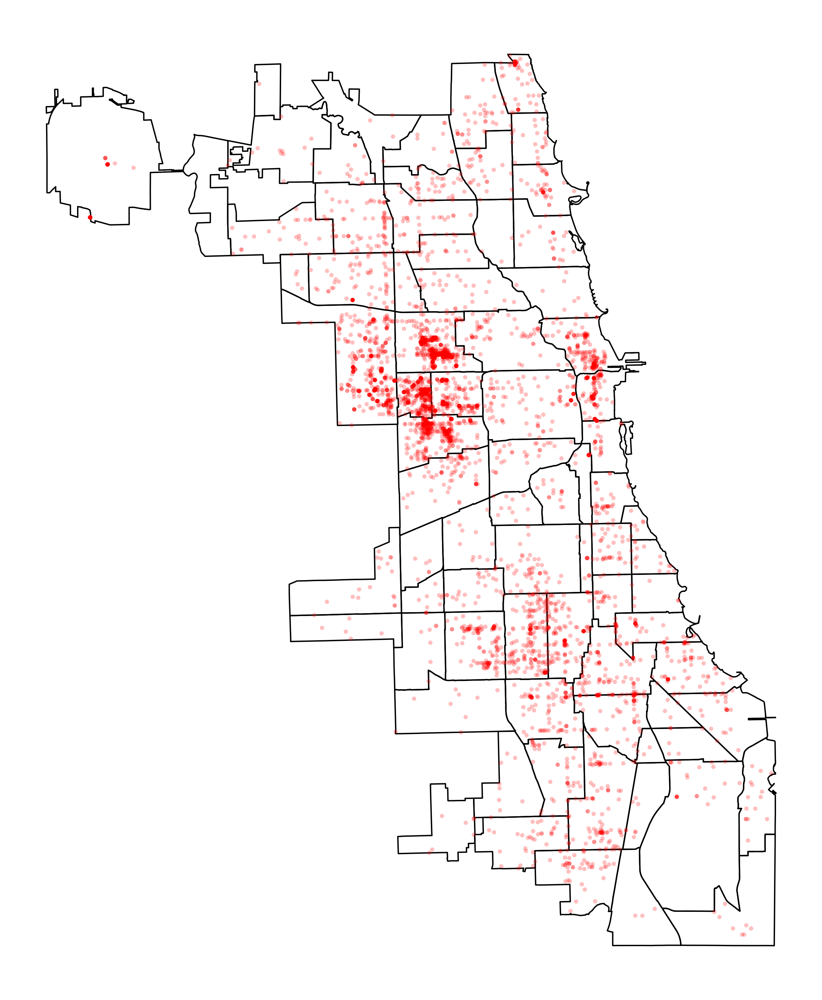

In [47]:
fig, ax = plt.subplots(figsize=(13, 13), dpi=300)

chicago_boundaries.plot(ax=ax, facecolor='none', edgecolor='black')
narcotic_crime.plot(ax=ax, alpha=.25, color='red', edgecolor='none', markersize=10)

ax.axis('off')

# scale = 600
# canvas = ds.Canvas(plot_width=scale, plot_height=int(scale*1.5))
# agg = canvas.points(narcotic_crime, geometry='geometry')
# img = ds.tf.shade(agg, cmap=colorcet.fire)
# img = ds.tf.set_background(img, 'black')
# img

## Census

Using the default year of 2021
Using FIPS code '17' for input 'il'
Using FIPS code '031' for input 'cook'


<Axes: >

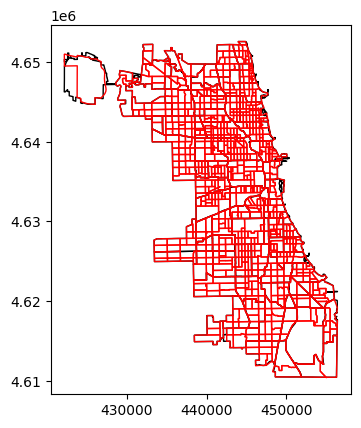

In [48]:
import pygris

tracts = pygris.tracts(cb=True, county='cook', state='il')[['GEOID', 'geometry']].to_crs("EPSG:26916")

# Filter tracts down to just chicago tracts, as defined by centroid locations
relevant_geoids = gpd\
    .sjoin( 
        chicago_boundaries.to_crs('EPSG:26916'),
        gpd.GeoDataFrame(
            tracts.drop('geometry', axis=1), 
            geometry=tracts.centroid, 
            crs='EPSG:26916'
        ),
        predicate='contains'
        )['GEOID']
tracts = tracts[tracts['GEOID'].isin(relevant_geoids)]

fig, ax = plt.subplots()

chicago_boundaries.to_crs('EPSG:26916').plot(ax=ax, edgecolor='black', facecolor='none')
tracts.plot(ax=ax, edgecolor='red', facecolor='none')


In [49]:
data = pd.read_csv('../data/censusdata.csv')
data['GEOID'] = data['GEOID'].astype('str').apply(lambda x: x.split('.')[0])
data = data.merge(tracts, on='GEOID').dropna()
data = gpd.GeoDataFrame(data, geometry=data.geometry, crs='EPSG:26916')

data.head()

,GEOID,TotalPopulation,WhiteP,BlackP,AsianP,HispP,18to24P,Ovr65P,MHSdP,MedInc,HighRiskJobP,Unemployment,PovP,NoIntP,VacantP,geometry
0,17031010100,4284.0,44.701214,32.119514,2.194211,21.475257,15.989729,12.861811,22.619048,36610.0,9.421922,9.769154,18.678526,7.795004,21.074099,"POLYGON ((443936.001 4652545.254, 444376.060 4..."
1,17031010201,8210.0,25.420219,36.650426,3.629720,24.397077,11.412911,9.001218,40.651907,35407.0,16.481994,4.088542,28.177833,9.775429,7.682927,"POLYGON ((443315.826 4652166.333, 443663.936 4..."
2,17031010202,2865.0,31.134380,32.984293,10.890052,19.406632,10.855148,13.438045,30.828890,29590.0,12.734082,8.914209,22.928709,6.541292,7.207891,"POLYGON ((443961.380 4652152.982, 444254.861 4..."
3,17031010300,6237.0,53.599487,23.617124,5.419272,16.931217,8.866442,24.338624,25.777001,37530.0,14.699793,4.030656,2.235099,7.712504,8.222892,"POLYGON ((444418.780 4652145.271, 444570.448 4..."
4,17031010400,4473.0,79.991057,7.914152,4.761905,8.450704,37.916387,7.780013,8.151766,34095.0,9.866667,3.200000,5.737705,14.285714,14.142678,"POLYGON ((445065.309 4651413.606, 445241.499 4..."


<Axes: >

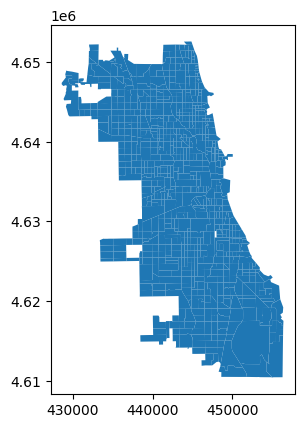

In [50]:
data.plot()

In [51]:
data.drop('GEOID', axis=1).describe()

,TotalPopulation,WhiteP,BlackP,AsianP,HispP,18to24P,Ovr65P,MHSdP,MedInc,HighRiskJobP,Unemployment,PovP,NoIntP,VacantP
count,788.000000,788.000000,788.000000,788.000000,788.000000,788.000000,788.000000,788.000000,7.880000e+02,788.000000,788.000000,788.000000,788.000000,788.000000
mean,3446.760152,39.246092,34.329132,6.233867,26.672239,9.933819,13.581850,36.808170,-2.495631e+06,20.013918,9.824584,14.153261,11.569976,10.621266
std,1783.100076,28.990652,38.218882,9.847120,27.957897,6.974949,7.174905,20.950101,4.108483e+07,9.539730,7.804362,12.850518,8.570161,7.277628
min,656.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.406243,0.000000,-6.666667e+08,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1994.750000,8.503722,2.689320,0.027640,5.178863,6.132592,8.455339,18.780346,2.662325e+04,12.572712,4.088455,4.314310,4.835686,5.651550
50%,3122.500000,40.054556,9.784889,2.752235,14.666646,8.798732,12.457828,38.155280,3.474300e+04,19.082701,7.344591,11.136421,9.869054,9.259656
75%,4540.000000,65.046409,78.536150,8.146042,40.558834,11.915786,17.316557,53.361125,5.287875e+04,26.365350,13.200733,20.739786,16.542139,13.040081
max,12213.000000,92.423551,100.000000,80.987124,98.832071,82.153306,51.538015,84.961240,1.268270e+05,58.424908,41.217799,70.942408,45.918367,48.333333


<Axes: >

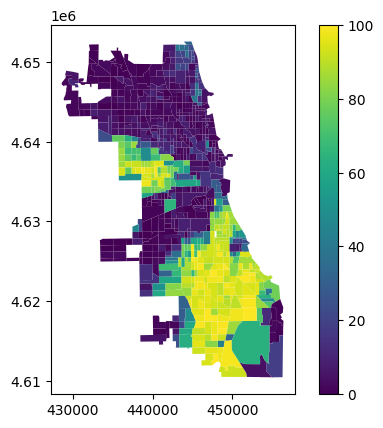

In [58]:
data.plot('BlackP', legend=True)

<Axes: >

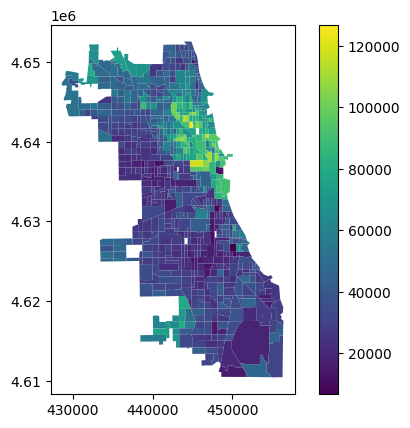

In [52]:
data[data.MedInc>0].plot('MedInc', legend=True)

<Axes: >

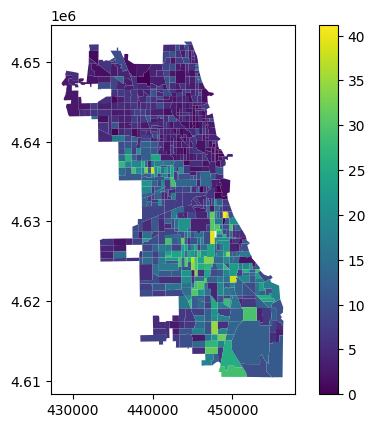

In [53]:
data.plot('Unemployment', legend=1)

## SVI

<Axes: >

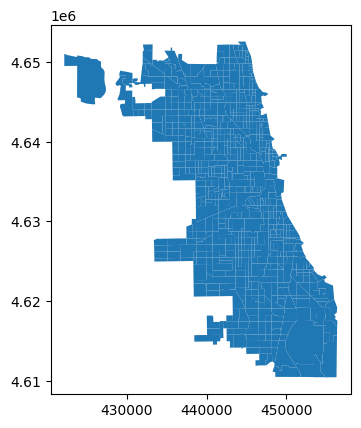

In [54]:
svi = pd.read_csv('../data/illinois_svi_2022.csv')\
    [['FIPS', 'RPL_THEME1', 'RPL_THEME2', 'RPL_THEME3', 'RPL_THEME4', 'RPL_THEMES']]\
    .rename({'FIPS':'GEOID'}, axis=1)

svi['GEOID'] = svi['GEOID'].astype('str').apply(lambda x: x.split('.')[0])

svi = svi.merge(tracts, on='GEOID')
svi = gpd.GeoDataFrame(svi, geometry=svi.geometry, crs='EPSG:26916')

svi.plot()

In [55]:
svi.drop('GEOID', axis=1).describe()

,RPL_THEME1,RPL_THEME2,RPL_THEME3,RPL_THEME4,RPL_THEMES
count,791.000000,791.000000,791.000000,791.000000,791.000000
mean,-3.128101,-3.298225,-3.043379,-3.200099,-3.150280
std,61.486624,61.476344,61.491516,61.482001,61.485236
min,-999.000000,-999.000000,-999.000000,-999.000000,-999.000000
25%,0.438250,0.152350,0.603450,0.383750,0.415350
50%,0.764100,0.507400,0.812800,0.610000,0.721400
75%,0.907950,0.808200,0.926800,0.805900,0.887100
max,1.000000,0.999700,0.983400,1.000000,0.998800


<Axes: >

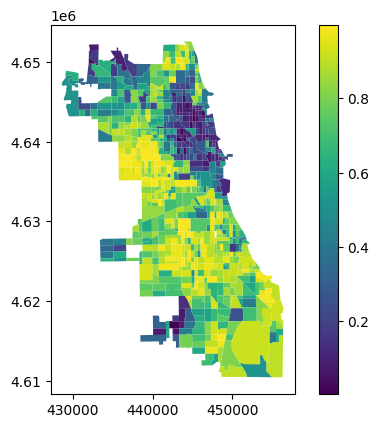

In [56]:
svi[svi['RPL_THEMES'] > 0].plot('RPL_THEMES', legend=True)

In [57]:
pd.read_csv('../data/access/moud_access.csv')

C:\Users\wimer\AppData\Local\Temp\ipykernel_25720\3650607297.py:1: DtypeWarning: Columns (7) have mixed types. Specify dtype option on import or set low_memory=False.
  pd.read_csv('../data/access/moud_access.csv')


,Unnamed: 0,GEOID,COUNTYFP,moudMinDis,bupMinDis,metMinDis,nalMinDis,bupTime,bupCount,bupScore,metTime,metCount,metScore,nalTime,nalCount,nalScore
0,1,28075000300,75,1.571650,1.571650,1.581588,1.975332,5,13.0,2.433333,7,8.0,0.833333,7,8.0,1.666667
1,2,28075000600,75,1.022112,1.456406,1.022112,1.910936,4,13.0,2.366667,11,8.0,0.866667,11,8.0,1.400000
2,3,28077960100,77,10.691173,10.691173,60.160346,33.928432,23,1.0,0.233333,99,0.0,0.000000,70,0.0,0.000000
3,4,28081950301,81,7.659164,7.659164,44.448542,9.280002,18,7.0,1.033333,,0.0,0.000000,74,0.0,0.233333
4,5,28085950600,85,1.629512,1.629512,64.867888,25.272560,5,5.0,0.833333,74,0.0,0.000000,74,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72334,72335,9009140200,9,0.270237,0.270237,0.781731,0.781731,0,381.0,3.000000,19,1.0,2.900000,6,10.0,2.966667
72335,72336,9009170800,9,0.658313,0.658313,12.310903,2.888643,0,567.0,2.833333,23,21.0,1.300000,3,51.0,2.333333
72336,72337,9009352800,9,1.458919,1.501934,1.458919,1.458919,5,204.0,2.300000,9,14.0,2.500000,9,28.0,2.433333
72337,72338,9015900100,15,4.522457,4.578448,8.435107,4.522457,10,132.0,1.700000,45,0.0,0.900000,28,28.0,1.900000
